In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets

In [10]:
data, labels = datasets.make_classification(n_samples = 1000, n_features = 2, n_classes = 2, n_clusters_per_class = 1, 
                                           n_informative = 2, n_redundant = 0, random_state = 3)

In [11]:
data.shape

(1000, 2)

In [12]:
labels[labels == 0] =-1

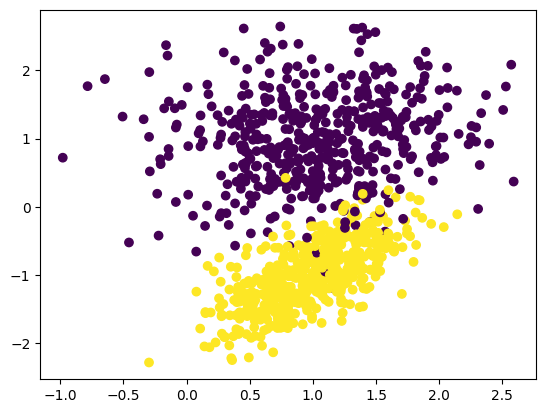

In [13]:
plt.scatter(data[:, 0], data[:, 1], c = labels)

In [14]:
# class Svm:
#     def __init__(self, c = 0.001):
#         self.c = 0
#         self.w = 0
#         self.b = 0
    
#     def hingeloss(self, w, b, x, y):
#         loss = 0
#         loss += 0.5 * (np.dot(w, w.T))
        
#         for i in range(x.shape[0]):
#             ti = y[i] * (np.dot(w, x[i]) + b)
#             loss += self.c * max(0, (1 - ti))
#         return loss[0][0]
    
#     def gradient_descent(self, x, y, lr_rate =0.003, epochs =1000, batch_size =200):
        
#         W = np.zeros((1,x.shape[1]))
#         B = 0
#         h_loss = self.hingeloss(W, B, x, y)
#         loss = [] 
#         print(loss)     
#         loss.append(h_loss)
#         #Applying stochastic gradient descent
#         for i in range(epochs):
#             loss.append(self.hingeloss(W, B, x, y))
                
#             idx = np.arange(x.shape[0])
#             np.random.shuffle(idx)
            
#             for batch in range(int(x.shape[0]/batch_size)):            
#                 grad_w = 0
#                 grad_b = 0
#                 for j in range(batch * batch_size , (batch +1) *batch_size):
#                     j = idx[j]
#                     ti = y[j] * (np.dot(W, x[j])+B)
#                     print(loss)
#                     if ti >= 1:
#                         grad_b = 0
#                         grad_w = 0
#                     else:
#                         grad_w += self.c *y[j] * x[j]
#                         grad_b += self.c *y[j]
                    
#                 W = W - lr_rate * W + lr_rate * grad_w
#                 B = B - lr_rate * grad_b
#             self.w = W
#             self.b = B
#             return W, B, loss
                

In [25]:
class SVM:
    def __init__(self, c = 0.001):
        self.c = c
        self.w = 0
        self.b = 0
    
    def hingeloss(self, w, b, x, y):
        loss = 0
        loss += 0.5 * (np.dot(w, w.T))
        
        for i in range(x.shape[0]):
            ti = y[i] * (np.dot(w, x[i]) + b)
            loss += self.c * max(0, (1 - ti))
        return loss[0][0]
    
    def gradient_descent(self, x, y, lr_rate = 0.01, epoch = 1000, batch_size = 200):
        
        W = np.zeros((1, x.shape[1]))
        B = 0
        h_loss = self.hingeloss(W, B, x, y)
        loss = []
        loss.append(h_loss)
        
        for i in range(epoch):
            loss.append(self.hingeloss(W, B, x, y))
            print(f'loss = {loss}')
            idx = np.arange(x.shape[0])
            np.random.shuffle(idx)
            
            for batch in range(int(x.shape[0]/batch_size)):
                grad_w = 0
                grad_b = 0
                
                for j in range(batch * batch_size, (batch + 1) * batch_size):
                    j = idx[j]
                    ti = y[j] * (np.dot(W, x[j]) + B)
                    
                    if ti >= 1:
                        grad_w = 0
                        grad_b = 0
                    else:
                        grad_w += self.c * y[j] * x[j]
                        grad_b += self.c * y[j]
                W = W - lr_rate * W + lr_rate * grad_w
                B = B - lr_rate * grad_b
            
        self.w = W
        self.b = B
        return W, B, loss

In [26]:
obj = SVM()
W, B, loss = obj.gradient_descent(data, labels)

loss = [1.0000000000000007, 1.0000000000000007]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483, 0.9810428061345452]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483, 0.9810428061345452, 0.9723851554574]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483, 0.9810428061345452, 0.9723851554574, 0.964219448536871]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483, 0.9810428061345452, 0.9723851554574, 0.964219448536871, 0.9565228238770226]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483, 0.9810428061345452, 0.9723851554574, 0.964219448536871, 0.9565228238770226, 0.9492600791873868]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483, 0.9810428061345452, 0.9723851554574, 0.964219448536871, 0.9565228238770226, 0.9492600791873868, 0.9424070653611195]
loss = [1.0000000000000007, 1.0000000000000007, 0.9902382434063483, 0.98104

In [27]:
loss[-10:]


[0.8199016429535348,
 0.8199016507905775,
 0.8199022192909049,
 0.8199025343306611,
 0.8199013508150189,
 0.8199003653347512,
 0.8199014352703924,
 0.8198993597591042,
 0.8198989266646267,
 0.8198995695162563]

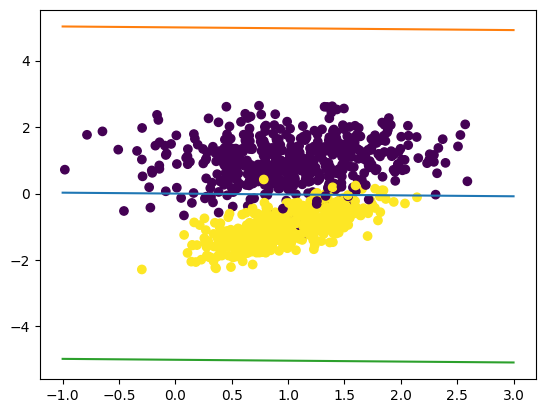

In [20]:
x0 = np.arange(-1, 4)
x1 = -(B + (W[0, 0] * x0))/W[0, 1]

s1 = -(B + (W[0, 0] * x0) + 1)/W[0, 1]
s2 = -(B + (W[0, 0] * x0) - 1)/W[0, 1]

plt.plot(x0, x1)
plt.plot(x0, s1)
plt.plot(x0, s2)
plt.scatter(data[:, 0], data[:, 1], c = labels)